In [1]:
from hidrocomp.series import Flow
import pandas as pd
import plotly as py
import plotly.graph_objects as go

In [2]:
flow_sar = Flow(data=pd.read_csv("sar.csv", index_col=0, parse_dates=True))
flow_ons = Flow(data=pd.read_csv("ons.csv", index_col=0, parse_dates=True))
flow_sar_ons = Flow(data=flow_ons.data.combine_first(flow_sar.data["D19086"].to_frame()))

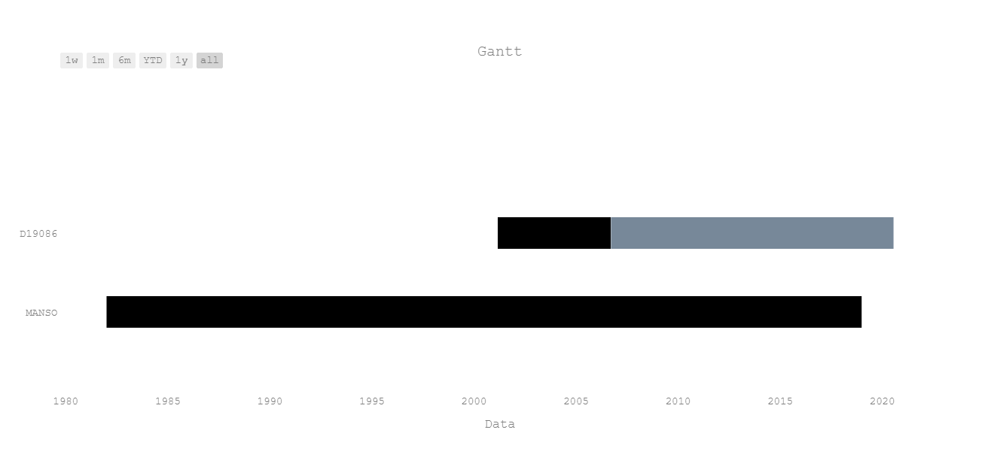

In [3]:
fig_gantt, data_gantt = flow_sar_ons.gantt("Gantt")
py.offline.iplot(fig_gantt)

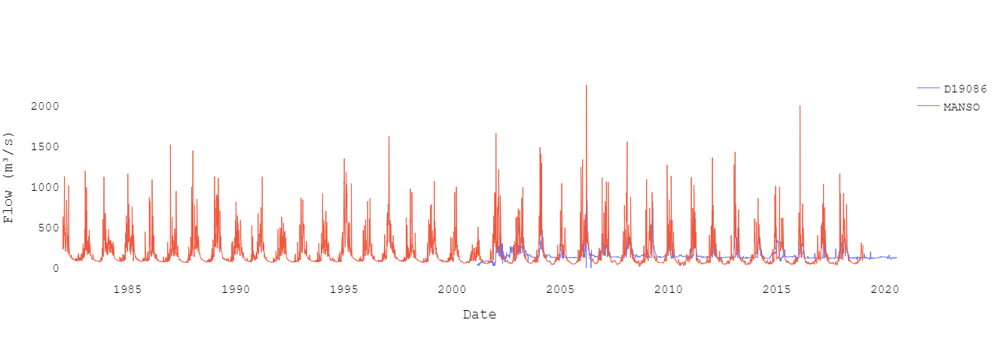

In [4]:
fig_hidro, data_hidro = flow_sar_ons.hydrogram("")
py.offline.iplot(fig_hidro)

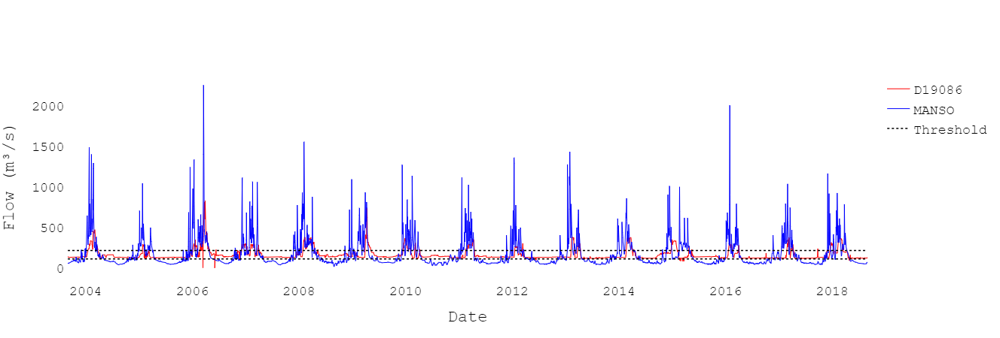

In [5]:
start_period = "01/09/2003"
end_period = "31/08/2018"
flow_sar_ons.date(date_start=start_period, date_end=end_period)
threshold_high = flow_ons.quantile(0.75)[0]
threshold_low = flow_ons.quantile(0.50)[0]
fig_start_filling_hydro, data_start_filling_hydro = flow_sar_ons.hydrogram("", color={"MANSO": "#0000FF", "D19086": "#FF0000"}, threshold=[threshold_high, threshold_low], size_text=18)
fig_start_filling_hydro["data"][2]["name"] = "Threshold"
fig_start_filling_hydro["data"][3]["showlegend"] = False
py.offline.iplot(fig_start_filling_hydro)

In [6]:
# fig_hidro = go.Figure(fig_start_filling_hydro)
# fig_hidro.write_image("hidro_manso_sar.png", width=1400, height=800)

In [7]:
flow_ana = Flow(data=pd.read_csv("ana.csv", index_col=0, parse_dates=True))

In [8]:
nulls = flow_sar.data["D19086"].isnull()
date_start = flow_sar.data.loc[nulls].index[0] - pd.timedelta_range(start='1 day', periods=1, freq='D')
date_end = flow_sar.data.loc[nulls].index[-1]

date_range = pd.date_range(start=date_start.values[0], end=date_end)

delta = None
for date in date_range:
    if nulls[date]:
        flow_sar.data["D19086"][date] = flow_ana.data["66231000"][date] + delta
    delta = flow_sar.data["D19086"][date] - flow_ana.data["66231000"][date]

In [9]:
zeros = flow_sar.data.loc[flow_sar.data["D19086"]==0].index

for date in zeros:
    flow_sar.data["D19086"][date] = flow_ana.data["66231000"][date]

Variables:

Magnitude:
- 1-day maximum
- 1-day minimum

Duration:
- High pulse duration
- Low pulse duration

Frequency:
- High pulse count
- Low pulse count

Timing:
- Date of maximum
- Date of minimum

# Control x Impact

In [10]:
start_period = "01/09/2003"
end_period = "31/08/2018"
flow_pre = Flow(data=flow_ons.data)
flow_pre.date(date_start=start_period, date_end=end_period)

In [11]:
 # q90
threshold_high = flow_ons.quantile(0.75)[0]
f"Threshold high: {threshold_high}"

'Threshold high: 213.0'

In [12]:
# q50
threshold_low = flow_ons.quantile(0.50)[0]
f"Threshold low: {threshold_low}"

'Threshold low: 109.0'

## Manso

In [13]:
iha_pre = flow_pre.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [14]:
iha_pre.summary()

,Coeff. of Var.,Means
1-day maximum,171.199142,652.947127
1-day minimum,10.405677,78.664631
High events count,3.420482,2.540541
Low events count,3.476433,2.567568
High events duration,5.443449,15.443199
Low events duration,25.852296,35.345904
Date of maximum,52.787405,141.140101
Date of minimum,43.464891,237.203814


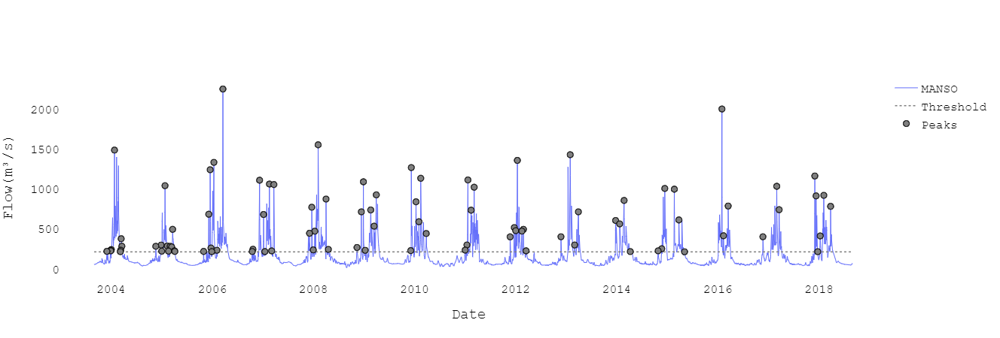

In [15]:
fig_events_high, data_events_high = iha_pre.events_high.plot_hydrogram(title="", point_start_end=False)
py.offline.iplot(fig_events_high)

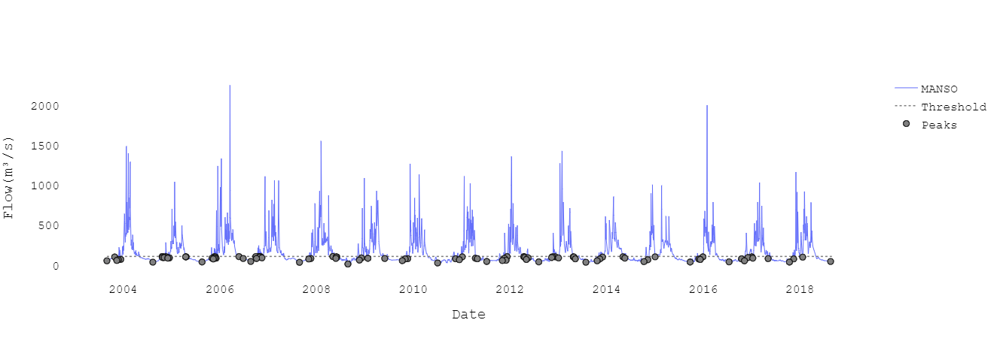

In [16]:
fig_events_low, data_events_low = iha_pre.events_low.plot_hydrogram(title="", point_start_end=False)
py.offline.iplot(fig_events_low)

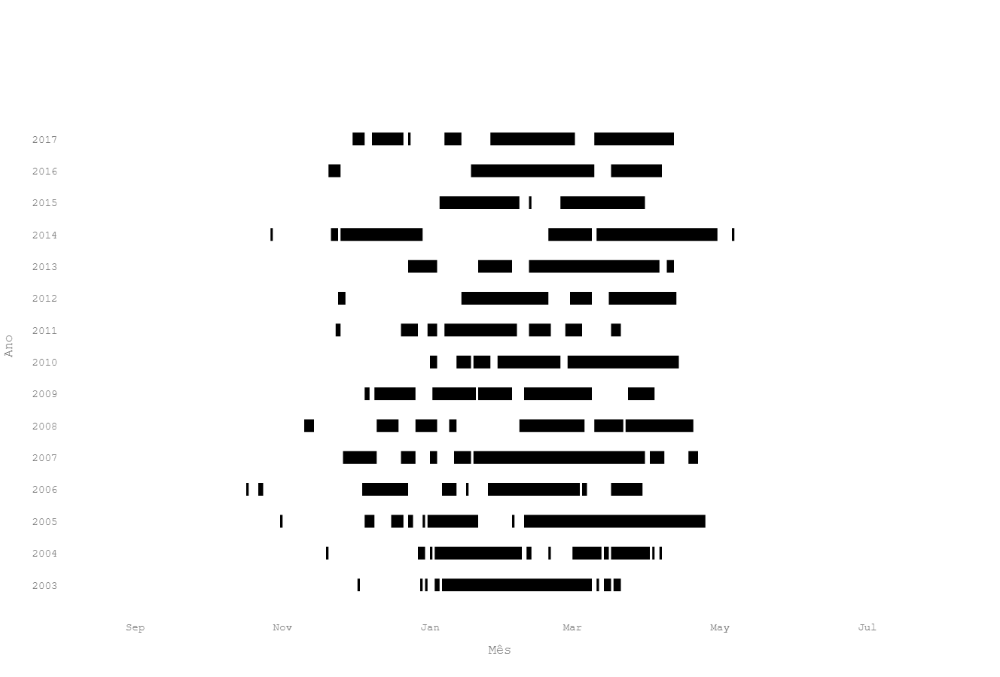

In [17]:
fig_events_high_spells, data_events_high_spells = iha_pre.events_high.plot_spells("")
py.offline.iplot(fig_events_high_spells)

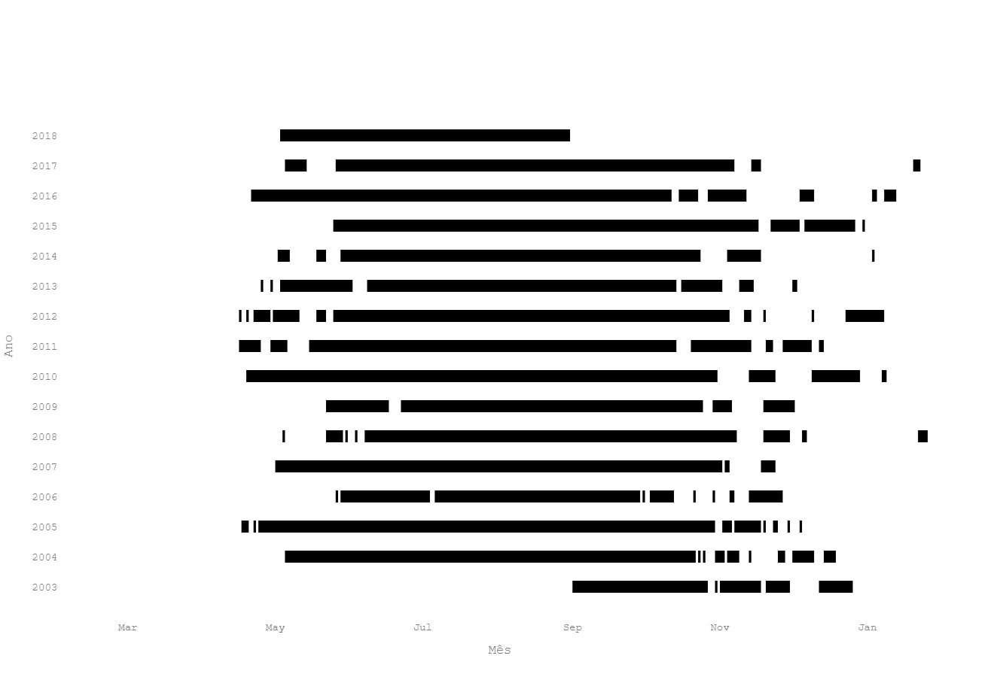

In [18]:
fig_events_low_spells, data_events_low_spells = iha_pre.events_low.plot_spells("")
py.offline.iplot(fig_events_low_spells)

# Observado

In [19]:
flow_obs = Flow(data=flow_sar.data["D19086"].to_frame())
flow_obs.date(date_start=start_period, date_end=end_period)

In [20]:
iha_pos = flow_obs.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [21]:
iha_pos.summary()

,Coeff. of Var.,Means
1-day maximum,122.986882,344.221511
1-day minimum,9.087079,96.750000
High events count,2.329571,2.263158
Low events count,0.964274,0.473684
High events duration,18.471687,24.893333
Low events duration,0.836660,1.500000
Date of maximum,53.656166,97.562222
Date of minimum,111.346307,195.000000


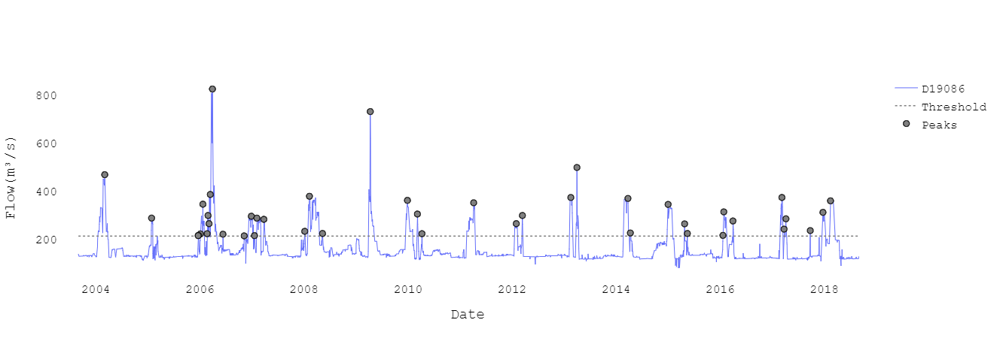

In [22]:
fig_events_high_pos, data_events_high_pos = iha_pos.events_high.plot_hydrogram(title="", point_start_end=False)
py.offline.iplot(fig_events_high_pos)

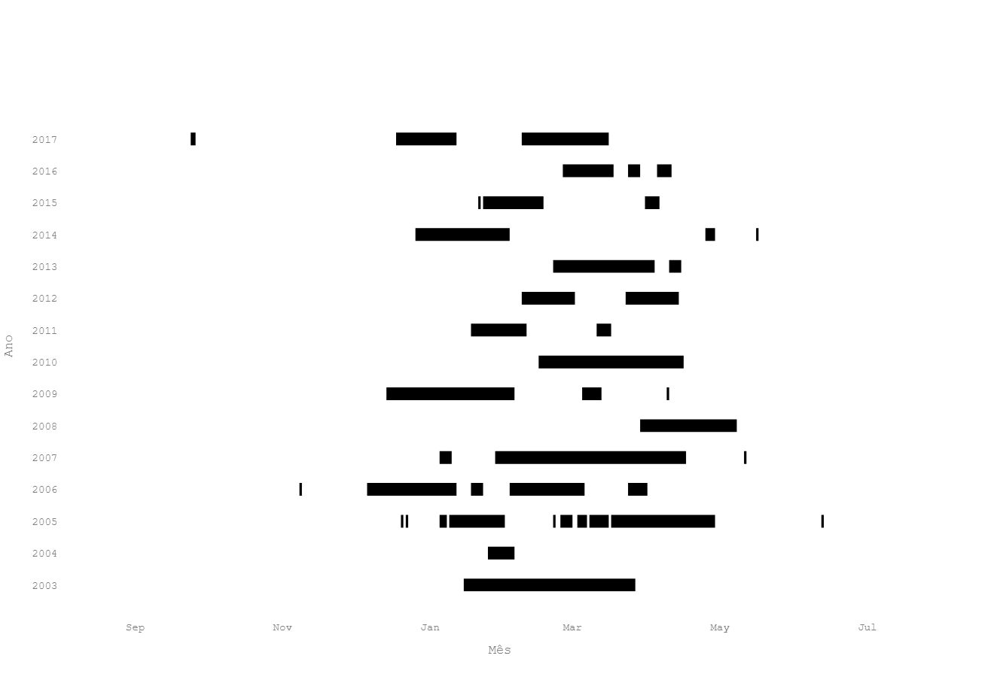

In [23]:
fig_events_high_spells_pos, data_events_high_spells_pos = iha_pos.events_high.plot_spells("")
py.offline.iplot(fig_events_high_spells_pos)

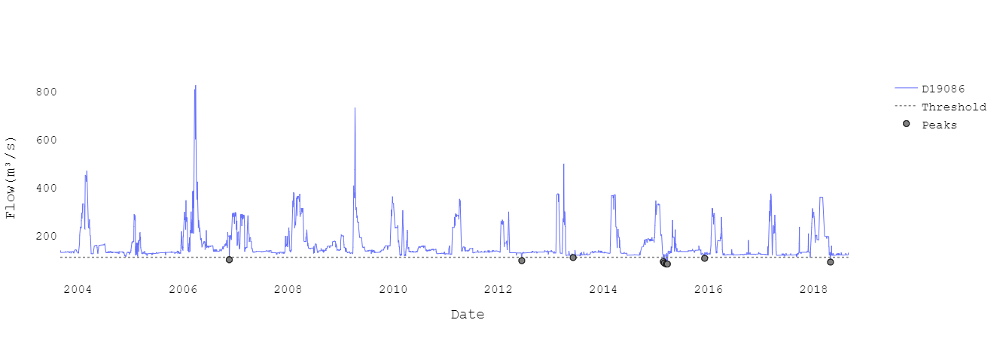

In [24]:
fig_events_low_pos, data_events_low_pos = iha_pos.events_low.plot_hydrogram(title="", point_start_end=False)
py.offline.iplot(fig_events_low_pos)

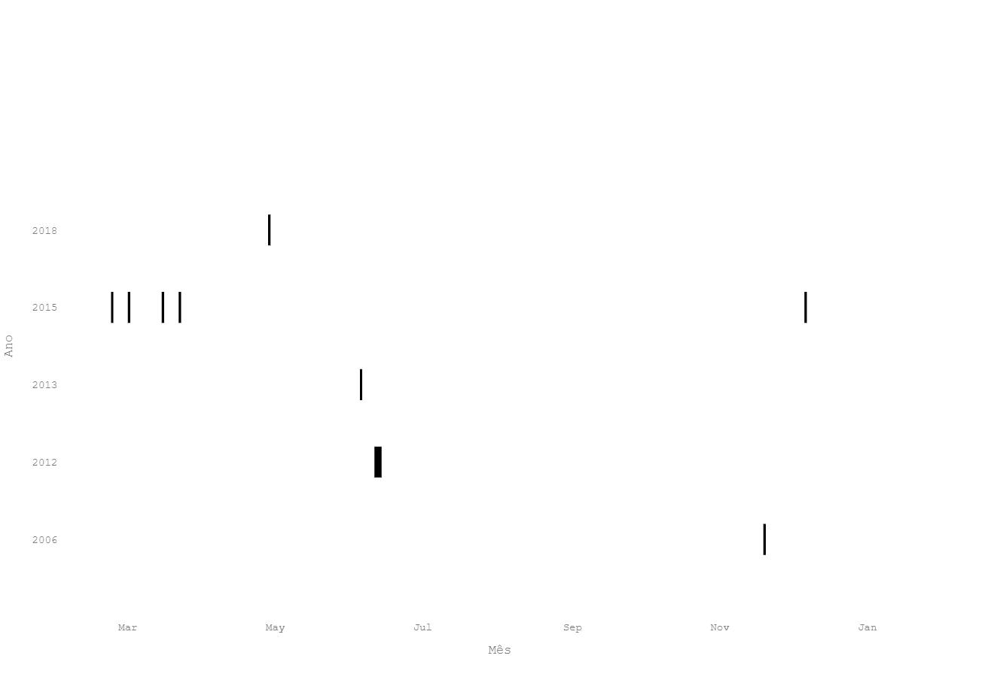

In [25]:
fig_events_low_spells_pos, data_events_low_spells_pos = iha_pos.events_low.plot_spells("")
py.offline.iplot(fig_events_low_spells_pos)

In [26]:
fig_polar_pre_high, data_polar_pre_high = iha_pre.events_high.plot_polar(title="Events High", color="#00008B")
fig_polar_pos_high, data_polar_pos_high = iha_pos.events_high.plot_polar(title="Events High", color="#00008B")

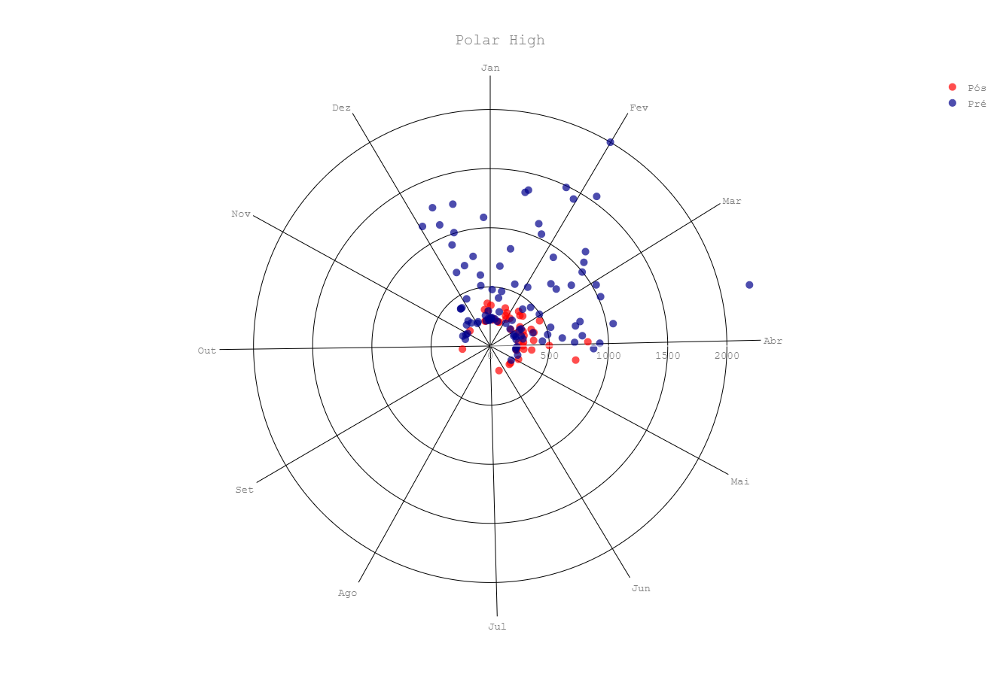

In [27]:
layout=fig_polar_pos_high['layout']

layout['title']['text'] = "Polar High"
data_polar_pos_high[0]['marker']['color'] = "red"
data_polar_pos_high[0]['name'] = "Pós"
data_polar_pre_high[0]['name'] = "Pré"
data_polar_pos_high = dict(data=data_polar_pos_high+[data_polar_pre_high[0]], layout=layout)

py.offline.iplot(data_polar_pos_high)

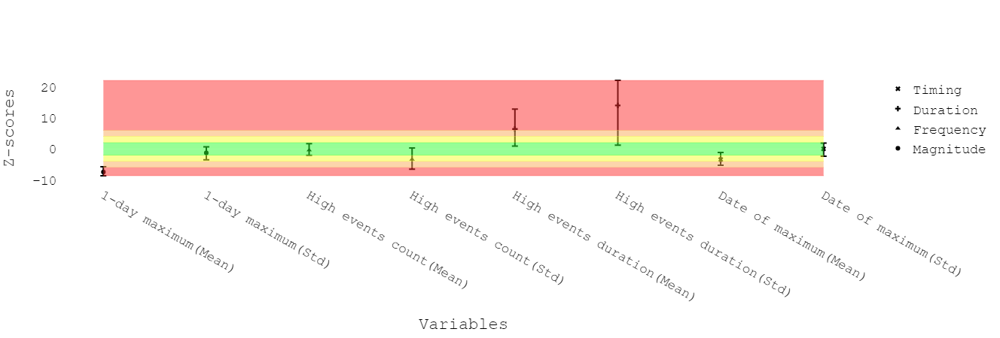

In [28]:
era = iha_pre.era(iha_obs=iha_pos, m=1000)
fig_high, data_high = era.plot(by_type_events="High", size_text=18, showlegend=True)
py.offline.iplot(fig_high)

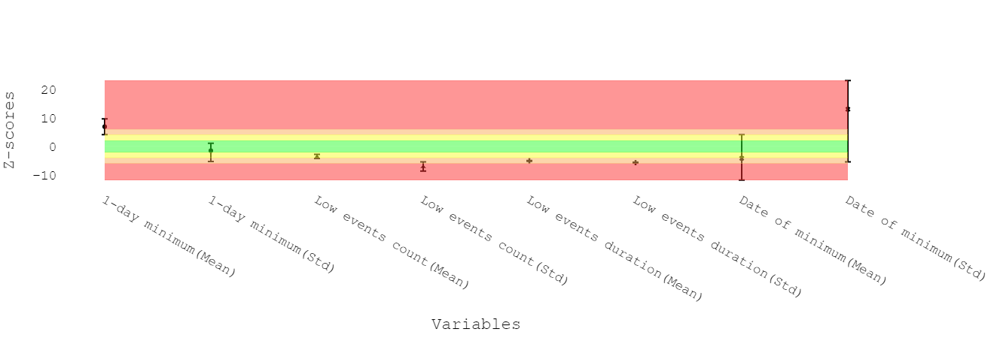

In [29]:
fig_low, data_low = era.plot(by_type_events="Low", showlegend=False, size_text=18)
py.offline.iplot(fig_low)

In [30]:
# fig_low.write_image("Zscore_low_one.png", width=1200, height=800)
# fig_high.write_image("Zscore_high_one.png", width=1200, height=800)

In [31]:
era.values_mean()

1-day maximum          -7.482361
1-day minimum           6.900776
Date of maximum        -3.451370
Date of minimum        -4.213754
High events count      -0.419466
High events duration    6.427233
Low events count       -3.668391
Low events duration    -5.100282
Name: Pos - mean, dtype: float64

In [32]:
flow_ons_copy = Flow(data=flow_ons.data)
flow_ons_copy.date(date_start="01/08/2007", date_end="31/07/2010")

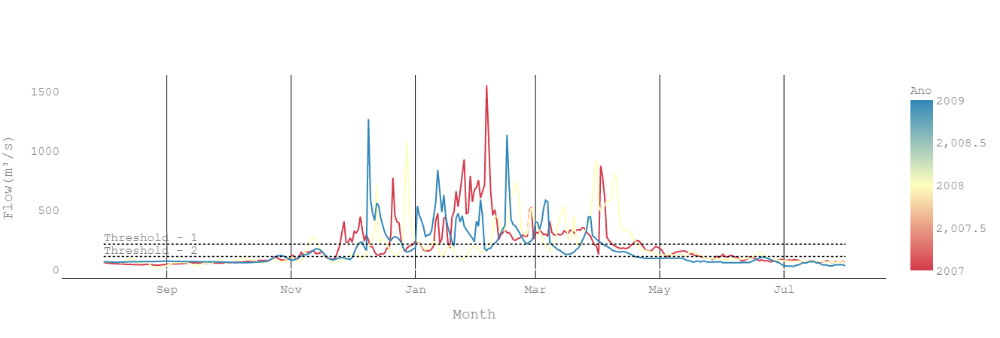

In [33]:
fig_hydro_year, data_hydro_year = flow_ons_copy.hydrogram_year(title="", threshold=[threshold_high, threshold_low], )
py.offline.iplot(fig_hydro_year)

In [34]:
fig = go.Figure(fig_hydro_year)
fig.write_image("hydro.png", width=1200, height=800)
# fig_high.write_image("Zscore_high_one.png", width=1200, height=800)